In [1]:
import os, gc
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler
from inspect import getfile, getsource
from diffusers import (
    AutoencoderKL,
    DDPMScheduler,
    DiffusionPipeline,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
    StableDiffusionPipeline,
    UNet2DConditionModel,
)
import torch
from transformers import AutoTokenizer, PretrainedConfig


/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/nessessence/anaconda3/envs/mace/lib/py

In [2]:
pretrained_model_name_or_path = "stablediffusionapi/chilloutmix"
pipeline = DiffusionPipeline.from_pretrained(pretrained_model_name_or_path, torch_dtype=torch.float16)


device = "cuda:0"
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
pipeline.safety_checker = None
pipeline.requires_safety_checker = False
pipeline = pipeline.to("cuda:2")
pipeline.set_progress_bar_config(disable=True)
    

/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
safety_checker/model.safetensors not found
Loading pipeline components...:   0%|                                          | 0/7 [00:00<?, ?it/s]/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
/home/nessessence/anaconda3/envs/mace/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are u

In [6]:
import torch
import matplotlib.pyplot as plt

def display_cfg_variation_grid(pipeline, base_seed, cfg_scales, num_gen_img=5, prompt="A photo of a crybaby art toy", device="cuda"):
    """
    Displays a grid of images: rows = different seeds, columns = different cfg_scales
    """
    fig, axs = plt.subplots(num_gen_img, len(cfg_scales), figsize=(3 * len(cfg_scales), 3 * num_gen_img))
    if num_gen_img == 1:
        axs = [axs]  # Make iterable

    for row in range(num_gen_img):
        seed = base_seed + row  # Different seed per row
        for col, cfg in enumerate(cfg_scales):
            generator = torch.Generator(device=device).manual_seed(seed)
            image = pipeline(prompt, generator=generator, guidance_scale=cfg).images[0]

            ax = axs[row][col] if num_gen_img > 1 else axs[col]
            ax.imshow(image)
            ax.axis("off")
            if row == 0:
                ax.set_title(f"CFG: {cfg}")

    plt.tight_layout()
    plt.show()


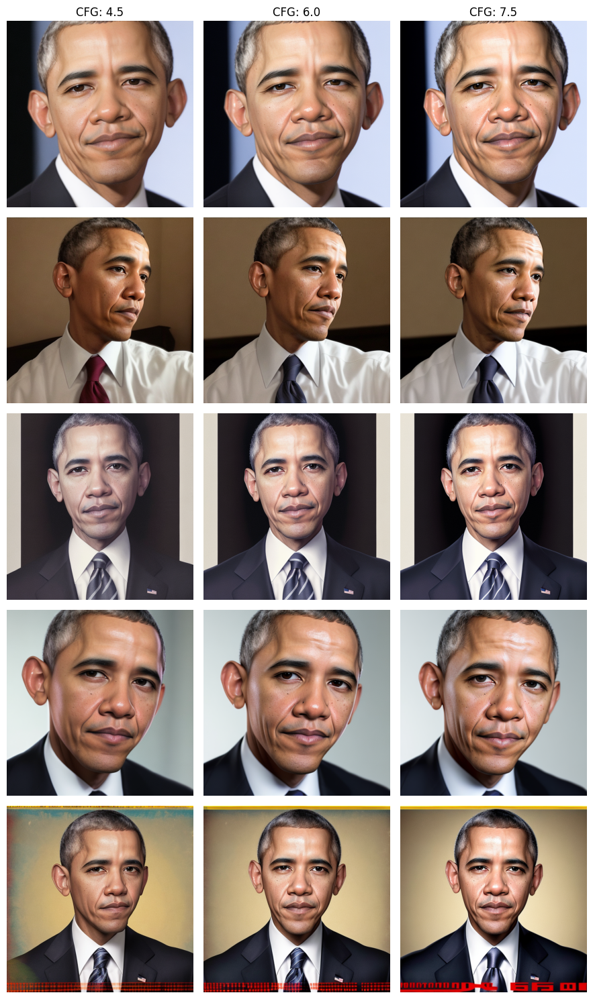

In [8]:
prompt = "A photo of Obama"
cfg_scales = [4.5,6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

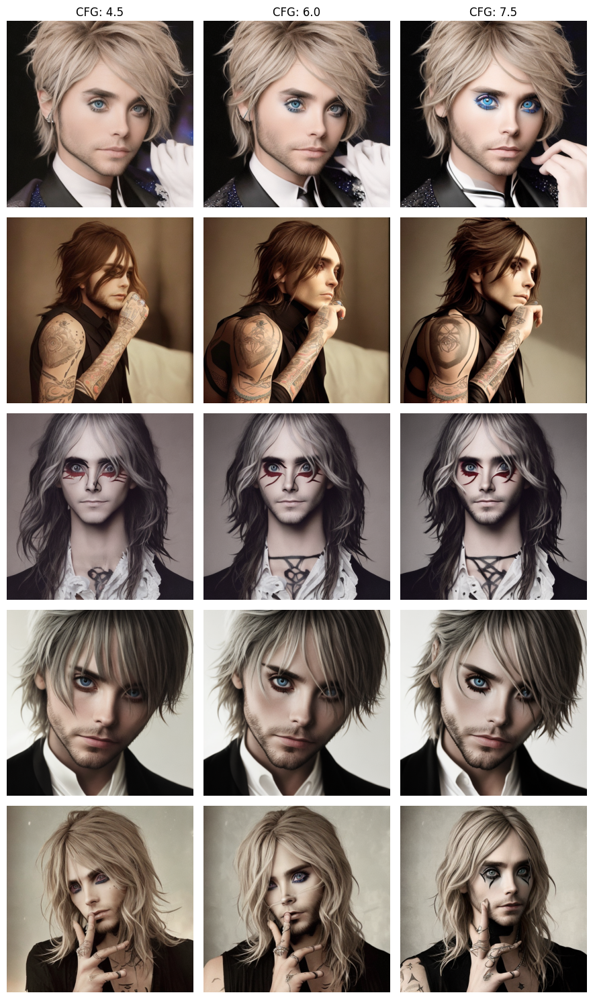

In [9]:
prompt = "A photo of Jered Leto"
cfg_scales = [4.5,6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

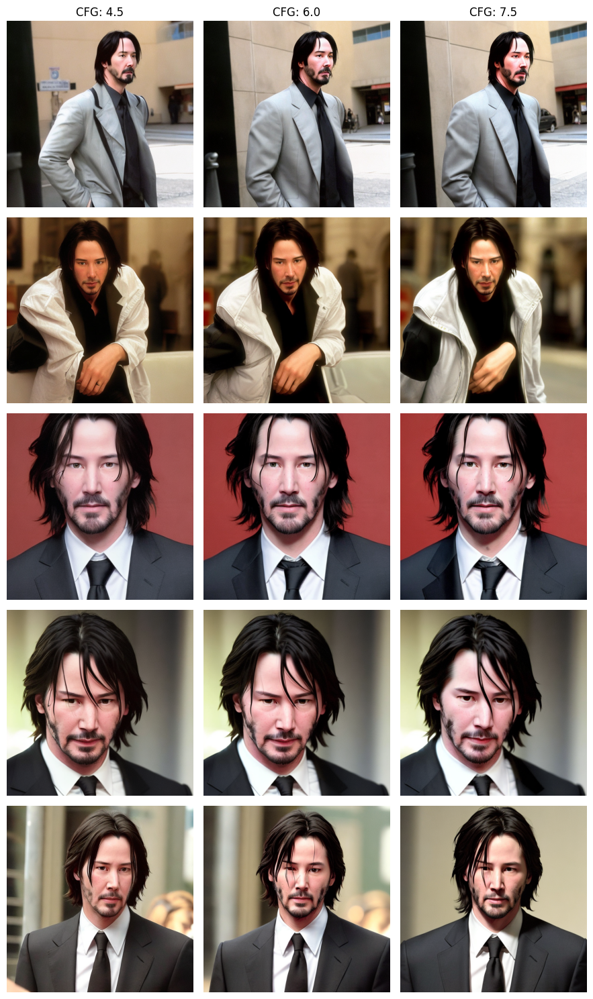

In [10]:
prompt = "A photo of Keanu Reeves"
cfg_scales = [4.5,6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

In [ ]:
prompt = "A photo of Rihanna"
cfg_scales = [4.5,6.0,7.5]
base_seed = 0
display_cfg_variation_grid(pipeline ,  base_seed=base_seed, cfg_scales=cfg_scales,prompt=prompt, num_gen_img=5)

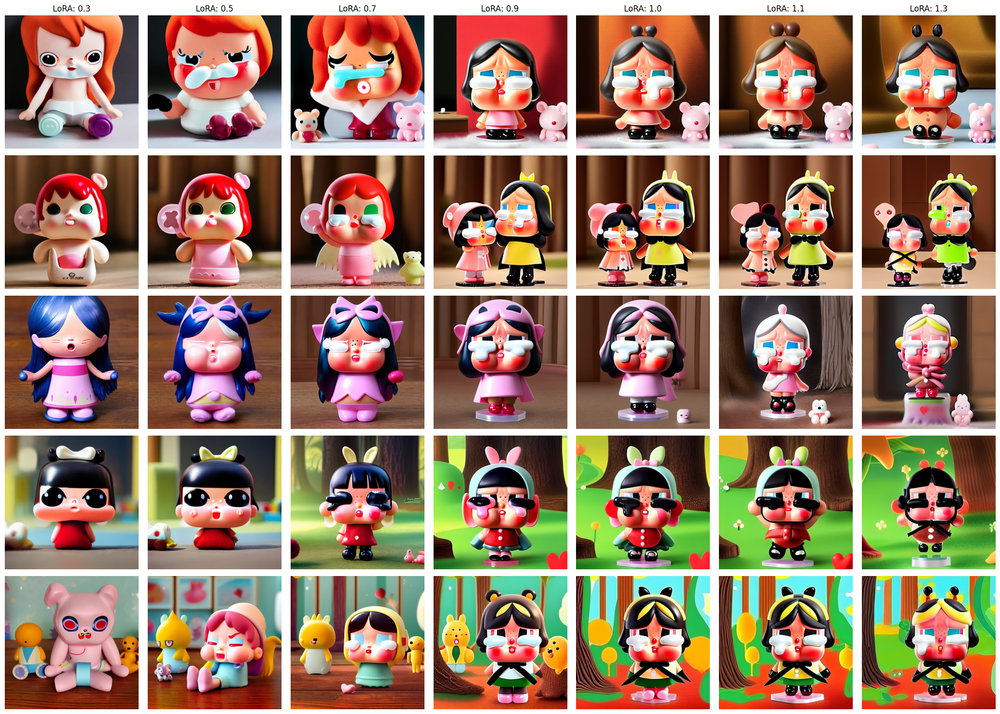

In [35]:
lora_scales = [0.3, 0.5, 0.7, 0.9,1.0,  1.1, 1.3]
display_lora_scale_variation_grid(pipeline, base_seed=0, lora_scales=lora_scales, num_gen_img=5)